#  <center> </center>
# <center>Trabajo Practico 1 </center>
### <center>Grupo 10 </center>
## Integrantes:
#### Alan Richmond
#### Flavian Ferré
#### Alan Mejia

# 0. Inicializacion de los datos

## Importando Librerias


In [1]:
#Manipulacion de datos
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import plotly.express as px

from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.cluster import KMeans
from yellowbrick.cluster import SilhouetteVisualizer

# 2. Agrupamiento

## Importado del dataset

In [2]:
conjunto_entrenamiento_final = pd.read_csv("Datasets/conjunto_entrenamiento_final.csv")
conjunto_entrenamiento_final

,latitud,longitud,place_l3,property_type,property_bedrooms,property_rooms,property_surface_covered,property_surface_total,property_price,price_per_square_meter
0,-34.637319,-58.361124,Boca,Departamento,2.0,3.0,55.0,58.0,82900.0,1429.310345
1,-34.628647,-58.361871,Boca,Departamento,3.0,4.0,70.0,70.0,99000.0,1414.285714
2,-34.610027,-58.401934,Balvanera,Departamento,2.0,4.0,104.0,138.0,146000.0,1057.971014
3,-34.631621,-58.416825,Boedo,PH,2.0,4.0,73.0,118.0,250000.0,2118.644068
4,-34.623886,-58.412746,Boedo,PH,1.0,2.0,46.0,61.0,100000.0,1639.344262
...,...,...,...,...,...,...,...,...,...,...
65445,-34.582800,-58.442800,Palermo,Departamento,1.0,1.0,32.0,36.0,98514.0,2736.500000
65446,-34.590332,-58.420135,Palermo,Departamento,3.0,4.0,72.0,81.0,200000.0,2469.135802
65447,-34.576232,-58.441949,Palermo,Departamento,2.0,3.0,57.0,62.0,130000.0,2096.774194
65448,-34.582800,-58.442800,Palermo,Departamento,1.0,1.0,32.0,36.0,100273.0,2785.361111


## Tendencia al clustering

In [3]:
numeric_columns = ['latitud', 'longitud', 'property_bedrooms', 'property_rooms',
                   'property_surface_covered', 'property_surface_total', 'property_price',
                   'price_per_square_meter']
categorical_columns = ['place_l3', 'property_type']

numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)
    ])

pipeline = Pipeline(steps=[('preprocessor', preprocessor)])
scaled_conjunto_entrenamiento_final = pipeline.fit_transform(conjunto_entrenamiento_final)

kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(scaled_conjunto_entrenamiento_final)
clusters_df = pd.DataFrame(clusters.tolist(), columns=["grupos"])
conjunto_clustering = conjunto_entrenamiento_final.copy()
conjunto_clustering = pd.concat([conjunto_clustering, clusters_df], axis=1)
conjunto_clustering.head(20)

c:\Users\flaph\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


,latitud,longitud,place_l3,property_type,property_bedrooms,property_rooms,property_surface_covered,property_surface_total,property_price,price_per_square_meter,grupos
0,-34.637319,-58.361124,Boca,Departamento,2.0,3.0,55.0,58.0,82900.0,1429.310345,1
1,-34.628647,-58.361871,Boca,Departamento,3.0,4.0,70.0,70.0,99000.0,1414.285714,1
2,-34.610027,-58.401934,Balvanera,Departamento,2.0,4.0,104.0,138.0,146000.0,1057.971014,1
3,-34.631621,-58.416825,Boedo,PH,2.0,4.0,73.0,118.0,250000.0,2118.644068,1
4,-34.623886,-58.412746,Boedo,PH,1.0,2.0,46.0,61.0,100000.0,1639.344262,2
5,-34.625588,-58.423056,Boedo,PH,2.0,4.0,54.0,104.0,185000.0,1778.846154,1
6,-34.629398,-58.425852,Boedo,Departamento,1.0,2.0,44.0,62.0,100000.0,1612.903226,2
7,-34.620748,-58.412004,San Cristobal,Departamento,2.0,3.0,55.0,59.0,185000.0,3135.593220,1
8,-34.626595,-58.420019,Boedo,PH,3.0,4.0,101.0,111.0,110000.0,990.990991,1
9,-34.630538,-58.419221,Boedo,Departamento,2.0,3.0,50.0,50.0,95000.0,1900.000000,1


Podemos observar una tendancia al clustering asi que el KMeans cree varios grupos, al minimo 2. Vamos a confirmarlo con la estadistica de Hopkins.

In [4]:
# Función para definir el coeficiente de Hopkins (tendencia al clustering del dataset)
def Hopkins(df,*args):
    n = df.shape[0] # filas
    d = df.shape[1] # columnas
    if not args:
        print("Numero de puntos al azar por defecto")
        m = int(0.1 * n) # cantidad de puntos al azar (default)
    else:
        m = args[0] # cantidad de puntos al azar

    nbrs = NearestNeighbors(n_neighbors=1, algorithm='brute').fit(df) # buscador de vecinos

    rand_ind = random.sample(range(0, n, 1), m) # indices al azar

    ui = []
    wi = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(np.random.normal(size=(1, d)).reshape(1, -1), 2, return_distance=True) # distancia a los nuevos puntos
        ui.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(df[rand_ind[j]].reshape(1, -1), 2, return_distance=True) # distancia a los puntos al azar
        wi.append(w_dist[0][1])

    H = sum(wi) / (sum(ui) + sum(wi))
    return H

#el valor que puede tomar el coeficiente de Hopkins es entre 0 (los clusters se generan mejor que el azar) y 0.5 (los clusters se generan igual que al azar)
hopkins = Hopkins(scaled_conjunto_entrenamiento_final)
hopkins

Numero de puntos al azar por defecto


0.026676381559516398

La estadistica de Hopkins nos permite obtener un coeficiente acerca de 0, lo que define una grande tendancia al clustering.

## Estimacion de la cantidad de clusters

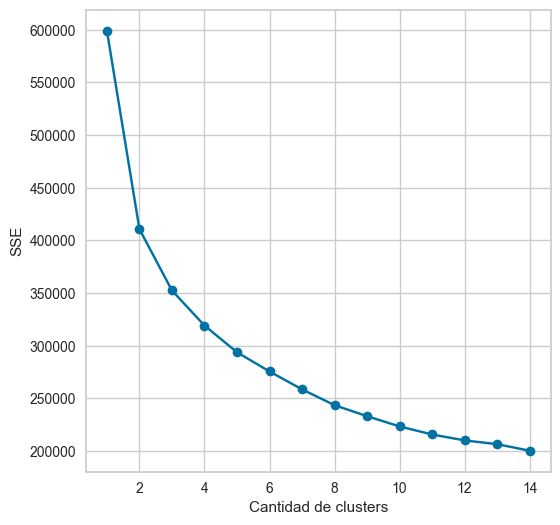

In [5]:
sse = []
list_k = list(range(1, 15))

for k in list_k:
    km = KMeans(n_clusters=k, n_init=10)
    km.fit(scaled_conjunto_entrenamiento_final)
    sse.append(km.inertia_)

# Grafico el SSE por K
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Cantidad de clusters')
plt.ylabel('SSE')
plt.show()

In [6]:
list_k = list(range(2, 5))

for n_clusters in list_k:
    clusterer = KMeans(n_clusters=n_clusters,n_init=10)
    preds = clusterer.fit_predict(scaled_conjunto_entrenamiento_final)

    score = silhouette_score (scaled_conjunto_entrenamiento_final, preds)
    print ("For n_clusters =" + str(n_clusters) + " silhouette score is " + str(score))

For n_clusters =2 silhouette score is 0.2841813703722083
For n_clusters =3 silhouette score is 0.2229930924449524
For n_clusters =4 silhouette score is 0.17439322032397298


Vamos a considerar que el mejor numero de cluster es 2.

## Analisis con 2 grupos

### Analisis de Silhouette

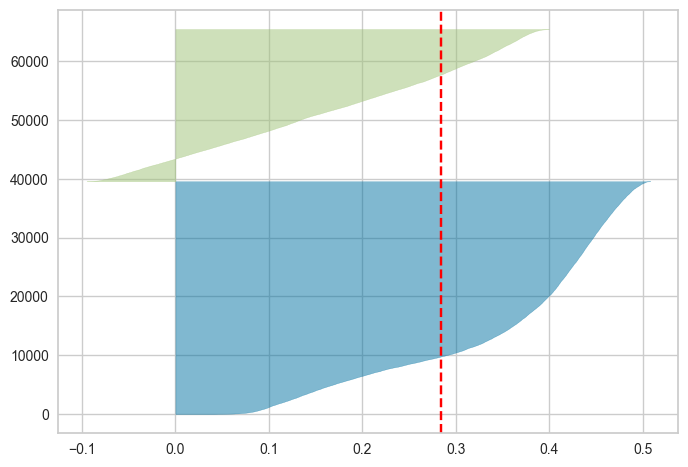

In [7]:
model = KMeans(2, random_state=0, n_init = 10)

# Visualizamos el gráfico de silueta
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')    # Instancio el visualizador
visualizer.fit(scaled_conjunto_entrenamiento_final)
plt.show()

Parece ser un bueno clastering porque los outliers son pequenos relativamente al reste de las predicciones. Podemos ver que hay un unico grupo en el cual estan los outliers, con aproximamente un quinto-sexto de las observaciones.

### Analisis de cada grupo

In [8]:
numeric_columns = ['latitud', 'longitud', 'property_bedrooms', 'property_rooms',
                   'property_surface_covered', 'property_surface_total', 'property_price',
                   'price_per_square_meter']
categorical_columns = ['place_l3', 'property_type']

numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)
    ])

pipeline = Pipeline(steps=[('preprocessor', preprocessor)])
scaled_conjunto_entrenamiento_final = pipeline.fit_transform(conjunto_entrenamiento_final)

kmeans = model
clusters = kmeans.fit_predict(scaled_conjunto_entrenamiento_final)
clusters_df = pd.DataFrame(clusters.tolist(), columns=["grupos"])
conjunto_clustering_2_grupos = conjunto_entrenamiento_final.copy()
conjunto_clustering_2_grupos = pd.concat([conjunto_clustering_2_grupos, clusters_df], axis=1)
conjunto_clustering_2_grupos.head(20)

,latitud,longitud,place_l3,property_type,property_bedrooms,property_rooms,property_surface_covered,property_surface_total,property_price,price_per_square_meter,grupos
0,-34.637319,-58.361124,Boca,Departamento,2.0,3.0,55.0,58.0,82900.0,1429.310345,0
1,-34.628647,-58.361871,Boca,Departamento,3.0,4.0,70.0,70.0,99000.0,1414.285714,1
2,-34.610027,-58.401934,Balvanera,Departamento,2.0,4.0,104.0,138.0,146000.0,1057.971014,1
3,-34.631621,-58.416825,Boedo,PH,2.0,4.0,73.0,118.0,250000.0,2118.644068,1
4,-34.623886,-58.412746,Boedo,PH,1.0,2.0,46.0,61.0,100000.0,1639.344262,0
5,-34.625588,-58.423056,Boedo,PH,2.0,4.0,54.0,104.0,185000.0,1778.846154,1
6,-34.629398,-58.425852,Boedo,Departamento,1.0,2.0,44.0,62.0,100000.0,1612.903226,0
7,-34.620748,-58.412004,San Cristobal,Departamento,2.0,3.0,55.0,59.0,185000.0,3135.593220,0
8,-34.626595,-58.420019,Boedo,PH,3.0,4.0,101.0,111.0,110000.0,990.990991,1
9,-34.630538,-58.419221,Boedo,Departamento,2.0,3.0,50.0,50.0,95000.0,1900.000000,0


In [9]:
conjunto_clustering_2_grupos.groupby('grupos')[['latitud', 'longitud']].describe()

latitud                                                        \
          count       mean       std        min        25%        50%   
grupos                                                                  
0       39573.0 -34.596435  0.025858 -34.694900 -34.615875 -34.597327   
1       25877.0 -34.594980  0.026920 -34.698989 -34.615601 -34.593628   

                             longitud                                  \
              75%        max    count       mean       std        min   
grupos                                                                  
0      -34.578156 -34.535964  39573.0 -58.438325  0.036729 -58.529550   
1      -34.574306 -34.536092  25877.0 -58.441046  0.037555 -58.529738   

                                                   
              25%       50%        75%        max  
grupos                                             
0      -58.465026 -58.43797 -58.410851 -58.343239  
1      -58.467217 -58.44139 -58.411577 -58.344378

La longitud y la latitud no parecen influir en la formación de grupos, ya que los valores se solapan en los dos grupos existentes.

In [10]:
conjunto_clustering_2_grupos[conjunto_clustering_2_grupos['grupos'] == 0]['place_l3'].value_counts()

place_l3
Palermo              4130
Recoleta             2924
Caballito            2581
Belgrano             2411
Almagro              2410
Villa Urquiza        2064
Balvanera            1979
Villa Crespo         1635
Nuñez                1435
Flores               1428
San Nicolas           962
Palermo Hollywood     947
Saavedra              902
Colegiales            874
Chacarita             851
Monserrat             769
Retiro                703
San Cristobal         672
Parque Chacabuco      573
Villa Del Parque      571
Boedo                 532
Constitucion          532
Villa Ortuzar         511
San Telmo             491
Villa Devoto          481
Barracas              449
Coghlan               418
Palermo Soho          411
Monte Castro          385
Villa Pueyrredon      380
Villa Gral. Mitre     368
Villa Santa Rita      322
Liniers               321
Villa Luro            274
Floresta              267
Parque Chas           255
Mataderos             253
Parque Patricios      253
Vel

In [11]:
conjunto_clustering_2_grupos[conjunto_clustering_2_grupos['grupos'] == 1]['place_l3'].value_counts()

place_l3
Palermo              3057
Recoleta             2567
Belgrano             2190
Caballito            2003
Villa Urquiza        1284
Flores               1082
Almagro               981
Balvanera             972
Nuñez                 966
Villa Crespo          825
Colegiales            727
Villa Devoto          633
Retiro                599
Saavedra              554
Villa Del Parque      407
Barracas              375
Parque Chacabuco      365
Villa Pueyrredon      329
San Nicolas           322
Palermo Chico         298
Boedo                 288
Villa Ortuzar         270
Chacarita             268
Coghlan               267
Monserrat             263
Palermo Hollywood     254
Puerto Madero         240
Liniers               225
Mataderos             224
Floresta              220
Villa Santa Rita      218
San Cristobal         214
Monte Castro          212
Palermo Soho          199
San Telmo             183
Constitucion          182
Velez Sarsfield       162
Villa Luro            158
Vil

No se pueden extraer conclusiones evidentes, ya que las propiedades parecen estar distribuidas uniformemente entre cada grupo en cada barrio

In [12]:
conjunto_clustering_2_grupos.groupby('grupos')['property_type'].value_counts()

grupos  property_type
0       Departamento     37440
        PH                2087
        Casa                46
1       Departamento     20800
        PH                3953
        Casa              1124
Name: count, dtype: int64

Casi todas las Casas están en el mismo grupo, lo que puede ser un factor determinante en la clasificación, a diferencia de los PH y Departamentos, que están divididos entre los dos grupos.

In [13]:
conjunto_clustering_2_grupos.groupby('grupos')[['property_bedrooms', 'property_rooms']].describe()

property_bedrooms                                               \
                   count      mean       std  min  25%  50%  75%  max   
grupos                                                                  
0                39573.0  1.184899  0.388351  1.0  1.0  1.0  1.0  3.0   
1                25877.0  2.407466  0.533601  1.0  2.0  2.0  3.0  4.0   

       property_rooms                                               
                count      mean       std  min  25%  50%  75%  max  
grupos                                                              
0             39573.0  1.893261  0.684870  1.0  1.0  2.0  2.0  4.0  
1             25877.0  3.448275  0.563073  1.0  3.0  3.0  4.0  6.0

Para estas dos variables, podemos ver que un primer grupo corresponde a los valores mas bajos de property_bedrooms y property_rooms, mientras que el segundo corresponde a los valores mas altos de estas mismas variables.

In [14]:
conjunto_clustering_2_grupos.groupby('grupos')[['property_surface_covered', 'property_surface_total']].describe()

property_surface_covered                                                \
                          count       mean        std  min   25%   50%    75%   
grupos                                                                          
0                       39573.0  42.027418  11.273592  1.0  34.0  41.0   50.0   
1                       25877.0  85.870348  23.737665  1.0  67.0  79.0  100.0   

              property_surface_total                                           \
          max                  count        mean        std   min   25%   50%   
grupos                                                                          
0       116.0                39573.0   48.166780  14.275052  12.0  38.0  47.0   
1       176.0                25877.0  101.822275  30.344804  40.0  79.0  94.0   

                      
          75%    max  
grupos                
0        57.0  170.0  
1       119.0  245.0

Para estas dos variables, podemos sacar la misma conclusion que para las variables property_bedrooms y property_rooms

In [15]:
conjunto_clustering_2_grupos.groupby('grupos')[['property_price', 'price_per_square_meter']].describe()

property_price                                                  \
                count           mean            std     min       25%   
grupos                                                                  
0             39573.0  107886.757537   41719.522138  5000.0   79000.0   
1             25877.0  239511.519573  101393.302047  7500.0  165000.0   

                                     price_per_square_meter               \
             50%       75%       max                  count         mean   
grupos                                                                     
0       100000.0  130000.0  390000.0                39573.0  2282.879907   
1       215000.0  290000.0  630000.0                25877.0  2407.944738   

                                                                      \
               std        min          25%          50%          75%   
grupos                                                                 
0       688.359988  60.240964  1823.333333  2212.121212  2647.058824   
1       871.151514  62.500000  1791.366906  2302.631579  2884.615385   

                     
                max  
grupos               
0       5546.875000  
1       5542.168675

En este caso, la conclusion es la misma solo para property_price, pero no para price_per_square_meter, lo que hace imposible diferenciar entre los dos grupos.

En conclusión, parece entenderse que en un grupo se incluyen las propiedades con muchas habitaciones y dormitorios, que tienen una mayor superficie y un precio mas elevado (independientemente del precio por metro cuadrado), y que, por el contrario, en el segundo grupo se incluyen las propiedades mas pequenos, con menos habitaciones y un precio mas bajo.

### Mapa de CABA

In [16]:
# Créer une carte centrée sur Buenos Aires
fig = px.scatter_mapbox(conjunto_clustering_2_grupos, lat="latitud", lon="longitud", color="grupos",
                        color_discrete_sequence=px.colors.qualitative, size_max=15, zoom=10)

# Mettre en forme la carte
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Afficher la carte
fig.show()

## Nueva analisis con 3 grupos

### Analisis de Silhouette

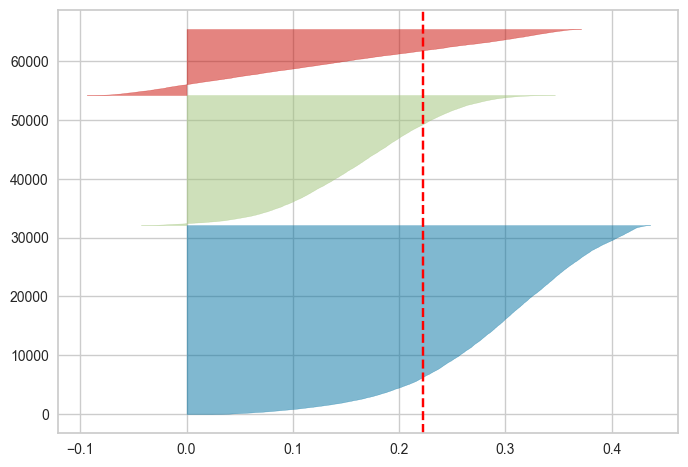

In [17]:
model = KMeans(3, random_state=0,n_init = 10)

# Visualizamos el gráfico de silueta
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')    # Instancio el visualizador
visualizer.fit(scaled_conjunto_entrenamiento_final)
plt.show()

Parece ser un bueno clastering porque los outliers son pequenos relativamente al reste de las predicciones. Podemos ver que hay principalmente dos grupos en los cuales estan los outliers, uno con pocos outliers y el otro con aproximamente un cuarto de las observaciones. Pero, en general, el clustering en 2 grupos es mas eficiente.

### Analisis de cada grupo

In [18]:
numeric_columns = ['latitud', 'longitud', 'property_bedrooms', 'property_rooms',
                   'property_surface_covered', 'property_surface_total', 'property_price',
                   'price_per_square_meter']
categorical_columns = ['place_l3', 'property_type']

numeric_transformer = StandardScaler()
categorical_transformer = OneHotEncoder()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)
    ])

pipeline = Pipeline(steps=[('preprocessor', preprocessor)])
scaled_conjunto_entrenamiento_final = pipeline.fit_transform(conjunto_entrenamiento_final)

kmeans = model
clusters = kmeans.fit_predict(scaled_conjunto_entrenamiento_final)
clusters_df = pd.DataFrame(clusters.tolist(), columns=["grupos"])
conjunto_clustering_3_grupos = conjunto_entrenamiento_final.copy()
conjunto_clustering_3_grupos = pd.concat([conjunto_clustering_3_grupos, clusters_df], axis=1)
conjunto_clustering_3_grupos.head(20)

,latitud,longitud,place_l3,property_type,property_bedrooms,property_rooms,property_surface_covered,property_surface_total,property_price,price_per_square_meter,grupos
0,-34.637319,-58.361124,Boca,Departamento,2.0,3.0,55.0,58.0,82900.0,1429.310345,1
1,-34.628647,-58.361871,Boca,Departamento,3.0,4.0,70.0,70.0,99000.0,1414.285714,1
2,-34.610027,-58.401934,Balvanera,Departamento,2.0,4.0,104.0,138.0,146000.0,1057.971014,1
3,-34.631621,-58.416825,Boedo,PH,2.0,4.0,73.0,118.0,250000.0,2118.644068,1
4,-34.623886,-58.412746,Boedo,PH,1.0,2.0,46.0,61.0,100000.0,1639.344262,0
5,-34.625588,-58.423056,Boedo,PH,2.0,4.0,54.0,104.0,185000.0,1778.846154,1
6,-34.629398,-58.425852,Boedo,Departamento,1.0,2.0,44.0,62.0,100000.0,1612.903226,0
7,-34.620748,-58.412004,San Cristobal,Departamento,2.0,3.0,55.0,59.0,185000.0,3135.593220,1
8,-34.626595,-58.420019,Boedo,PH,3.0,4.0,101.0,111.0,110000.0,990.990991,1
9,-34.630538,-58.419221,Boedo,Departamento,2.0,3.0,50.0,50.0,95000.0,1900.000000,1


In [19]:
conjunto_clustering_3_grupos.groupby('grupos')[['latitud', 'longitud']].describe()

latitud                                                        \
          count       mean       std        min        25%        50%   
grupos                                                                  
0       32124.0 -34.594011  0.025133 -34.694366 -34.612724 -34.594552   
1       22110.0 -34.603220  0.027179 -34.698989 -34.621927 -34.604369   
2       11216.0 -34.586644  0.023812 -34.692474 -34.599598 -34.585778   

                             longitud                                  \
              75%        max    count       mean       std        min   
grupos                                                                  
0      -34.576109 -34.535964  32124.0 -58.438496  0.036337 -58.529550   
1      -34.584587 -34.536002  22110.0 -58.442391  0.038678 -58.529738   
2      -34.568053 -34.536092  11216.0 -58.436098  0.035529 -58.529554   

                                                    
              25%        50%        75%        max  
grupos                                              
0      -58.464674 -58.438354 -58.411881 -58.343239  
1      -58.471467 -58.441900 -58.411817 -58.344584  
2      -58.460510 -58.437828 -58.408461 -58.344378

La longitud y la latitud no parecen influir en la formación de grupos, ya que los valores se solapan en los dos grupos existentes.

In [20]:
conjunto_clustering_3_grupos[conjunto_clustering_3_grupos['grupos'] == 0]['place_l3'].value_counts()

place_l3
Palermo              3650
Recoleta             2528
Belgrano             2122
Caballito            1954
Villa Urquiza        1837
Almagro              1835
Balvanera            1450
Nuñez                1304
Villa Crespo         1278
Flores                992
Palermo Hollywood     908
Saavedra              808
Chacarita             780
San Nicolas           753
Colegiales            722
Retiro                622
Monserrat             595
San Cristobal         468
Villa Ortuzar         447
Parque Chacabuco      442
Villa Del Parque      435
Constitucion          405
Boedo                 389
Palermo Soho          386
San Telmo             381
Villa Devoto          369
Coghlan               358
Barracas              323
Monte Castro          322
Villa Pueyrredon      299
Villa Gral. Mitre     265
Liniers               250
Parque Chas           237
Villa Luro            212
Villa Santa Rita      210
Floresta              184
Velez Sarsfield       183
Parque Patricios      169
Pal

In [21]:
conjunto_clustering_3_grupos[conjunto_clustering_3_grupos['grupos'] == 1]['place_l3'].value_counts()

place_l3
Caballito            1949
Palermo              1536
Recoleta             1390
Almagro              1319
Balvanera            1315
Flores               1188
Belgrano             1025
Villa Urquiza        1013
Villa Crespo          969
Nuñez                 556
Villa Devoto          510
Colegiales            493
San Nicolas           445
Villa Del Parque      425
Saavedra              422
Parque Chacabuco      421
Barracas              406
San Cristobal         397
Monserrat             386
Boedo                 370
Villa Pueyrredon      319
Mataderos             301
Retiro                301
Villa Santa Rita      292
Constitucion          290
Villa Lugano          272
Floresta              265
Villa Ortuzar         259
San Telmo             247
Liniers               230
Monte Castro          223
Chacarita             222
Coghlan               211
Villa Gral. Mitre     205
Velez Sarsfield       198
Villa Luro            189
Parque Patricios      179
Parque Avellaneda     168
Boc

In [22]:
conjunto_clustering_3_grupos[conjunto_clustering_3_grupos['grupos'] == 2]['place_l3'].value_counts()

place_l3
Palermo              2001
Recoleta             1573
Belgrano             1454
Caballito             681
Nuñez                 541
Villa Urquiza         498
Colegiales            386
Retiro                379
Flores                330
Palermo Chico         259
Puerto Madero         240
Almagro               237
Villa Devoto          235
Saavedra              226
Villa Crespo          213
Balvanera             186
Palermo Hollywood     158
Villa Del Parque      118
Chacarita             117
Coghlan               116
Palermo Soho          103
Barracas               95
Villa Pueyrredon       91
San Nicolas            86
Parque Chacabuco       75
Villa Ortuzar          75
Liniers                66
Boedo                  61
Monte Castro           52
Monserrat              51
Parque Chas            47
San Telmo              46
Floresta               38
Villa Santa Rita       38
Agronomia              38
Parque Patricios       36
Villa Luro             31
Villa Gral. Mitre      30
Ver

No se pueden extraer conclusiones evidentes, ya que las propiedades parecen estar distribuidas uniformemente entre cada grupo en cada barrio

In [23]:
conjunto_clustering_3_grupos.groupby('grupos')['property_type'].value_counts()

grupos  property_type
0       Departamento     30879
        PH                1218
        Casa                27
1       Departamento     17925
        PH                3779
        Casa               406
2       Departamento      9436
        PH                1043
        Casa               737
Name: count, dtype: int64

Es mas dificil sacar una conclusion aca que en el clustering a 2 grupos porque las Casas no parecen ser en uno de los grupos pero para los otros tipos es dificil concluir

In [24]:
conjunto_clustering_3_grupos.groupby('grupos')[['property_bedrooms', 'property_rooms']].describe()

property_bedrooms                                               \
                   count      mean       std  min  25%  50%  75%  max   
grupos                                                                  
0                32124.0  1.006817  0.082286  1.0  1.0  1.0  1.0  2.0   
1                22110.0  2.157711  0.426573  1.0  2.0  2.0  2.0  4.0   
2                11216.0  2.597896  0.553553  1.0  2.0  3.0  3.0  4.0   

       property_rooms                                               
                count      mean       std  min  25%  50%  75%  max  
grupos                                                              
0             32124.0  1.646308  0.493943  1.0  1.0  2.0  2.0  3.0  
1             22110.0  3.177521  0.442661  1.0  3.0  3.0  3.0  6.0  
2             11216.0  3.656562  0.587360  1.0  3.0  4.0  4.0  6.0

Para estas dos variables, podemos ver que un primer grupo corresponde a los valores mas bajos de property_bedrooms y property_rooms, mientras que el segundo corresponde a los valores medias de esas variables y el ultimo a las mas altos de estas mismas variables.

In [25]:
conjunto_clustering_3_grupos.groupby('grupos')[['property_surface_covered', 'property_surface_total']].describe()

property_surface_covered                                             \
                          count        mean        std   min    25%    50%   
grupos                                                                       
0                       32124.0   39.176815  10.014291   1.0  32.75   39.0   
1                       22110.0   66.859656  14.518633   1.0  57.00   65.0   
2                       11216.0  102.392564  24.448179  28.0  83.00  100.0   

                     property_surface_total                               \
          75%    max                  count        mean        std   min   
grupos                                                                     
0        45.0  116.0                32124.0   45.204178  13.004545  12.0   
1        75.0  150.0                22110.0   79.005292  22.765791  34.0   
2       120.0  176.0                11216.0  119.651658  31.137456  50.0   

                                   
         25%    50%    75%    max  
grupos                             
0       36.0   43.0   52.0  127.0  
1       63.0   75.0   90.0  235.0  
2       95.0  115.0  141.0  245.0

Para estas dos variables, podemos sacar la misma conclusion que para las variables property_bedrooms y property_rooms

In [26]:
conjunto_clustering_3_grupos.groupby('grupos')[['property_price', 'price_per_square_meter']].describe()

property_price                                                   \
                count           mean           std       min       25%   
grupos                                                                   
0             32124.0  106085.672332  43370.785272    6500.0   75000.0   
1             22110.0  153666.652962  46559.598620    5000.0  120000.0   
2             11216.0  326477.925553  90817.547799  139000.0  260000.0   

                                      price_per_square_meter               \
             50%        75%       max                  count         mean   
grupos                                                                      
0        96753.5  127969.75  390000.0                32124.0  2361.527368   
1       150000.0  185000.00  340000.0                22110.0  2015.396462   
2       300000.0  380000.00  630000.0                11216.0  2873.455029   

                                                                       \
               std         min          25%          50%          75%   
grupos                                                                  
0       689.586203  185.714286  1891.891892  2285.714286  2722.222222   
1       599.555937   60.240964  1594.202899  2000.000000  2410.714286   
2       938.479639  899.470899  2208.305046  2765.957447  3398.692810   

                     
                max  
grupos               
0       5546.875000  
1       4433.962264  
2       5542.168675

En este caso, la conclusion es la misma solo para property_price, pero no para price_per_square_meter, lo que hace imposible diferenciar entre los tres grupos.

En conclusión, parece entenderse que de la misma manera los grupos dividen las propiedades que tienen menos habitaciones/dormitorios/superficie/precio, las que tienen valores medias de esas variables y las que tienen los valores las mas altas.

### Mapa de CABA

In [27]:
# Créer une carte centrée sur Buenos Aires
fig = px.scatter_mapbox(conjunto_clustering_3_grupos, lat="latitud", lon="longitud", color="grupos",
                        color_discrete_sequence=px.colors.qualitative, size_max=15, zoom=10)

# Mettre en forme la carte
fig.update_layout(mapbox_style="carto-positron")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

# Afficher la carte
fig.show()

## Exportacion del conjunto a 2 clusters

In [28]:
conjunto_clustering_2_grupos.to_csv("Datasets/conjunto_clustering_2_grupos.csv", index=False)